In [1]:
import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.ticker
#%matplotlib inline

from scipy.stats import gaussian_kde
from scipy import stats
import os
import math

In [2]:
sns.set_context(
    "notebook", 
    font_scale = 1.5,       
    rc = { 
        "figure.figsize" : (30, 30), 
        "axes.titlesize" : 18 
    }
)

In [3]:
sns.set_style("whitegrid")

In [7]:
data_train = pd.read_csv("train.csv")

In [8]:
data_train.shape

(3865, 80)

In [9]:
data_train.head(3)

,galactic year,galaxy,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,...,"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,990025,Large Magellanic Cloud (LMC),0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052590
1,990025,Camelopardalis B,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,0.467873,...,NaN,NaN,NaN,NaN,NaN,19.177926,NaN,22.785018,NaN,0.059868
2,990025,Virgo I,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,0.363837,...,NaN,NaN,NaN,NaN,NaN,21.151265,6.53402,NaN,NaN,0.050449


In [10]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

In [12]:
missing_data(data_train)

,Total,Percent
Gender Inequality Index (GII),3021,78.163001
Current health expenditure (% of GGP),2998,77.567917
"Interstellar Data Net users, total (% of population)",2993,77.438551
Private galaxy capital flows (% of GGP),2991,77.386805
Interstellar phone subscriptions (per 100 people),2974,76.946960
...,...,...
existence expectancy at birth,1,0.025873
existence expectancy index,1,0.025873
galaxy,0,0.000000
y,0,0.000000


In [15]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3865 entries, 0 to 3864
Data columns (total 80 columns):
 #   Column                                                                                   Non-Null Count  Dtype  
---  ------                                                                                   --------------  -----  
 0   galactic year                                                                            3865 non-null   int64  
 1   galaxy                                                                                   3865 non-null   object 
 2   existence expectancy index                                                               3864 non-null   float64
 3   existence expectancy at birth                                                            3864 non-null   float64
 4   Gross income per capita                                                                  3837 non-null   float64
 5   Income Index                                                  

count    3865.000000
mean        0.082773
std         0.063415
min         0.013036
25%         0.047889
50%         0.057820
75%         0.087389
max         0.683813
Name: y, dtype: float64


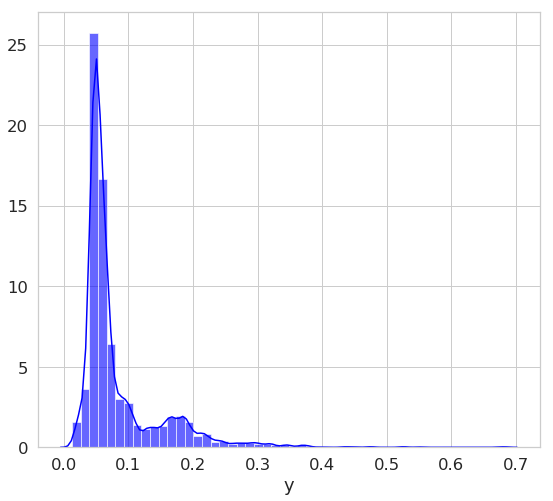

In [18]:
print(data_train['y'].describe())
plt.figure(figsize=(9, 8))
sns.distplot(data_train['y'], color='b', bins=50, hist_kws={'alpha': 0.6});

In [25]:
categorical_columns = [c for c in data_train.columns if data_train[c].dtype.name == 'object']
numerical_columns   = [c for c in data_train.columns if data_train[c].dtype.name != 'object']
print (categorical_columns)
print (numerical_columns)

['galaxy']
['galactic year', 'existence expectancy index', 'existence expectancy at birth', 'Gross income per capita', 'Income Index', 'Expected years of education (galactic years)', 'Mean years of education (galactic years)', 'Intergalactic Development Index (IDI)', 'Education Index', 'Intergalactic Development Index (IDI), Rank', 'Population using at least basic drinking-water services (%)', 'Population using at least basic sanitation services (%)', 'Gross capital formation (% of GGP)', 'Population, total (millions)', 'Population, urban (%)', 'Mortality rate, under-five (per 1,000 live births)', 'Mortality rate, infant (per 1,000 live births)', 'Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))', 'Population, ages 15–64 (millions)', 'Population, ages 65 and older (millions)', 'Life expectancy at birth, male (galactic years)', 'Life expectancy at birth, female (galactic years)', 'Population, under age 5 (millions)', 'Young age (0-14) dependency ratio (pe

In [27]:
data_train[categorical_columns].describe()

,galaxy
count,3865
unique,181
top,Andromeda XXIV
freq,26


In [29]:
for c in categorical_columns:
    print (data_train[c].unique())

['Large Magellanic Cloud (LMC)' 'Camelopardalis B' 'Virgo I'
 'UGC 8651 (DDO 181)' 'Tucana Dwarf' 'KKh 060' 'Grus II' 'UGCA 292'
 'Aquarius II' 'Andromeda XI' 'Antlia Dwarf' 'IC 1613 (UGC 668)' 'Leo P'
 'Cassiopeia Dwarf (Cas dSph, Andromeda VII)' 'Draco II' 'Sagittarius II'
 'Carina III' 'UGCA 133 (DDO 44)' 'Lacerta I (Andromeda XXXI)' 'Boötes IV'
 'Maffei 2' 'KUG 1210+301B (KK98 127)' 'Andromeda V'
 'Sagittarius Dwarf Sphr SagDEG' 'UGCA 276 (DDO 113)' 'Ursa Minor Dwarf'
 'UGC 9128 (DDO 187)' 'Andromeda XX' 'Segue 2' 'Fornax Dwarf (E356-G04)'
 'Columba I' 'KK98 77' 'Holmberg II (DDO 50, UGC 4305)'
 'ESO 540-030 (KDG 2)' 'NGC 404' 'UGC 8833' 'Perseus I (Andromeda XXXIII)'
 'Horologium II' 'Andromeda XXVI' 'Grus I' 'Andromeda IX'
 'Andromeda XXII[57]' 'ESO 274-01[70]' 'Leo II Dwarf (Leo B, DDO 93)'
 'Reticulum II' 'Andromeda II' 'Indus II' 'MB 1 (KK98 21)' 'UGCA 105'
 'Crater II' 'Andromeda XVIII[60]' 'KKH 11 (ZOAG G135.74-04.53)'
 'Phoenix Dwarf Galaxy (P 6830)' 'ESO 321-014[70]' 'ESO 

In [31]:
df_num = data_train.select_dtypes(include = ['float64', 'int64'])
df_num.head()

,galactic year,existence expectancy index,existence expectancy at birth,Gross income per capita,Income Index,Expected years of education (galactic years),Mean years of education (galactic years),Intergalactic Development Index (IDI),Education Index,"Intergalactic Development Index (IDI), Rank",...,"Intergalactic Development Index (IDI), female","Intergalactic Development Index (IDI), male",Gender Development Index (GDI),"Intergalactic Development Index (IDI), female, Rank","Intergalactic Development Index (IDI), male, Rank",Adjusted net savings,"Creature Immunodeficiency Disease prevalence, adult (% ages 15-49), total",Private galaxy capital flows (% of GGP),Gender Inequality Index (GII),y
0,990025,0.628657,63.125200,27109.234310,0.646039,8.240543,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052590
1,990025,0.818082,81.004994,30166.793958,0.852246,10.671823,4.742470,0.833624,0.467873,152.522198,...,NaN,NaN,NaN,NaN,NaN,19.177926,NaN,22.785018,NaN,0.059868
2,990025,0.659443,59.570534,8441.707353,0.499762,8.840316,5.583973,0.469110,0.363837,209.813266,...,NaN,NaN,NaN,NaN,NaN,21.151265,6.534020,NaN,NaN,0.050449
3,990025,0.555862,52.333293,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,5.912194,NaN,NaN,0.049394
4,990025,0.991196,81.802464,81033.956906,1.131163,13.800672,13.188907,0.910341,0.918353,71.885345,...,NaN,NaN,NaN,NaN,NaN,NaN,5.611753,NaN,NaN,0.154247


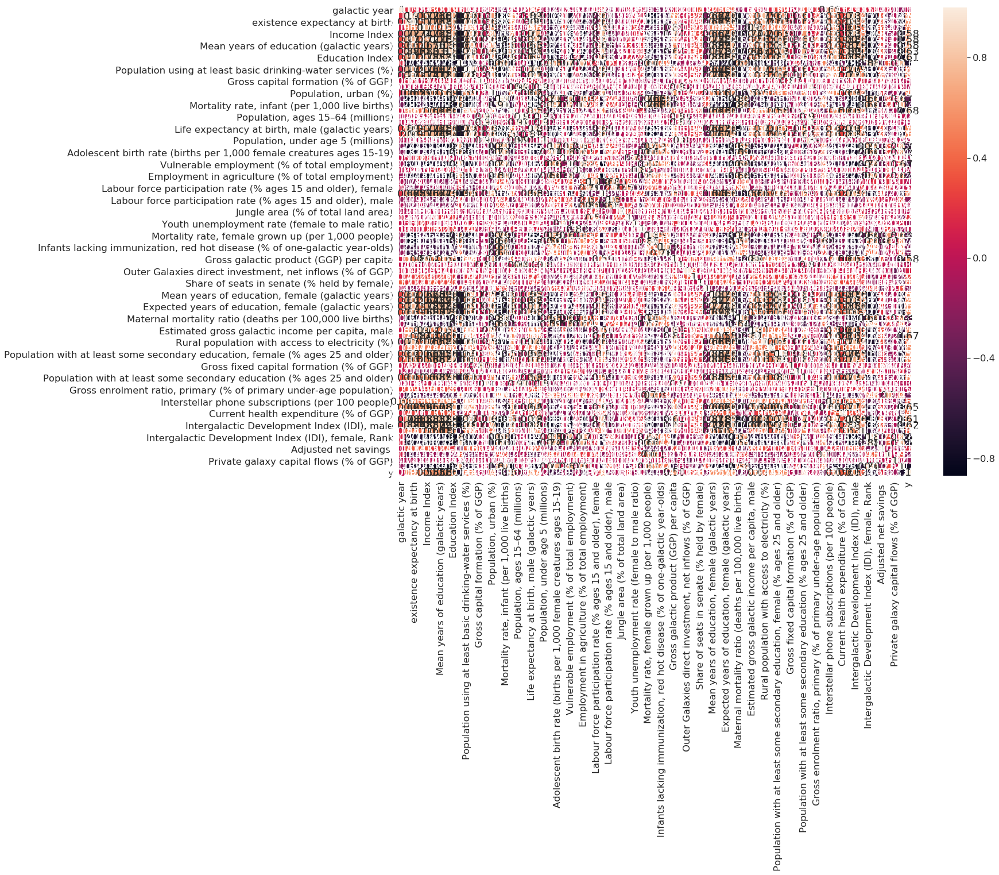

In [34]:
plt.figure(figsize = (20,15))
sns.heatmap(df_num.corr(),annot=True)

In [35]:
correlations = df_num.corr()['y'].sort_values()

print('Самая положительная корреляция:\n', correlations.tail(5))
print('\nСамая отрицательная корреляция:\n', correlations.head(5))

Самая положительная корреляция:
 Intergalactic Development Index (IDI)                                               0.625114
Interstellar Data Net users, total (% of population)                                0.651823
Estimated gross galactic income per capita, female                                  0.667465
Old age dependency ratio (old age (65 and older) per 100 creatures (ages 15-64))    0.679981
y                                                                                   1.000000
Name: y, dtype: float64

Самая отрицательная корреляция:
 Gender Inequality Index (GII)                                      -0.722279
Intergalactic Development Index (IDI), Rank                        -0.681592
Intergalactic Development Index (IDI), male, Rank                  -0.680577
Intergalactic Development Index (IDI), female, Rank                -0.664882
Young age (0-14) dependency ratio (per 100 creatures ages 15-64)   -0.533741
Name: y, dtype: float64


In [37]:
data_train = pd.read_csv("train.csv")

In [38]:
data_train['type'] = 'train'

In [39]:
data_test = pd.read_csv("test.csv")

In [40]:
data_test['type'] = 'test'

In [41]:
data_all = pd.concat([data_train,data_test])

In [44]:
data_all.shape

(4755, 81)

In [46]:
datasets = ['train', 'test']

In [107]:
def feature_dist(data_df, title, axn, datasetname):
    if title != 'y':
        df = data_df[(data_df['type']==datasetname)]
        sns.distplot(df[title], label=title, bins=50, ax=axn).set_title(datasetname)
        axn.legend(loc='best');

In [108]:
data_all['type'].value_counts()

train    3865
test      890
Name: type, dtype: int64

In [109]:
df_num = data_all.select_dtypes(include = ['float64', 'int64'])

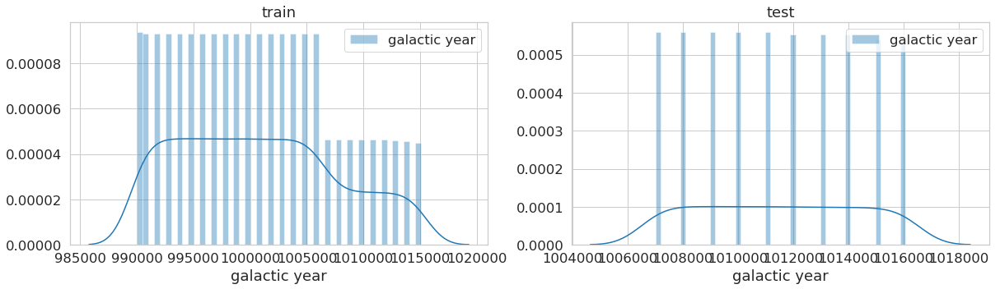

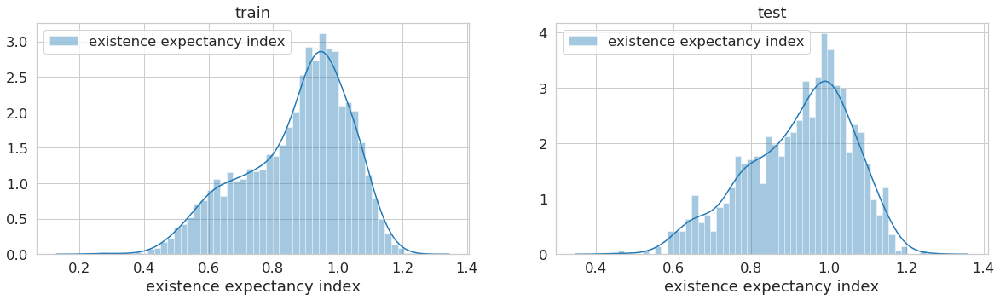

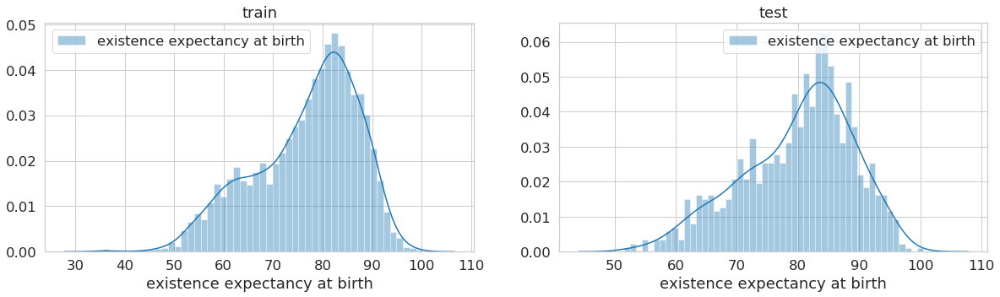

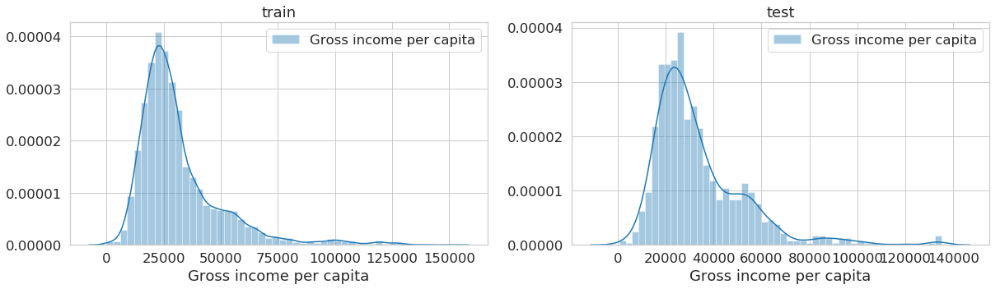

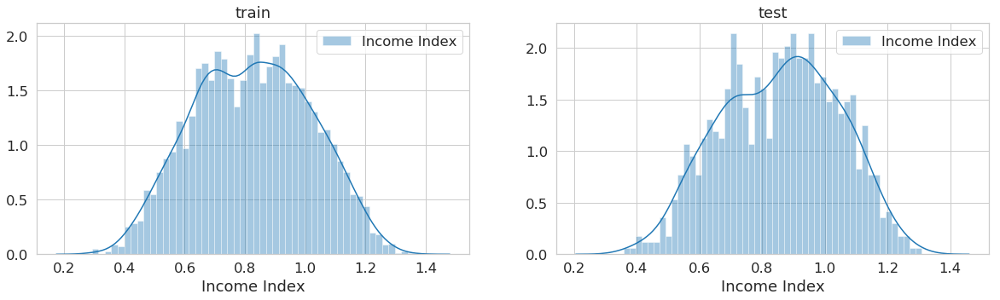

...

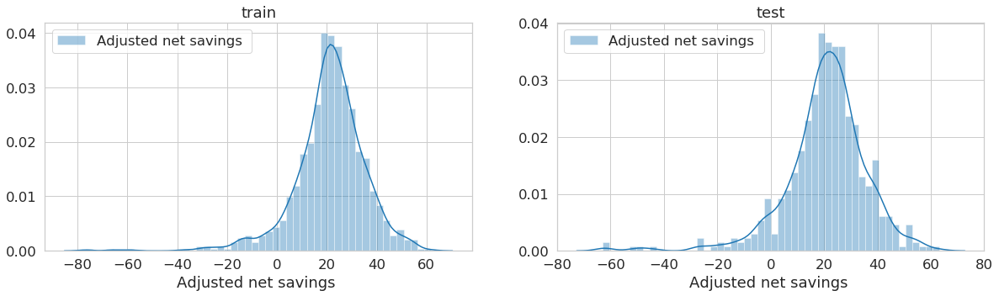

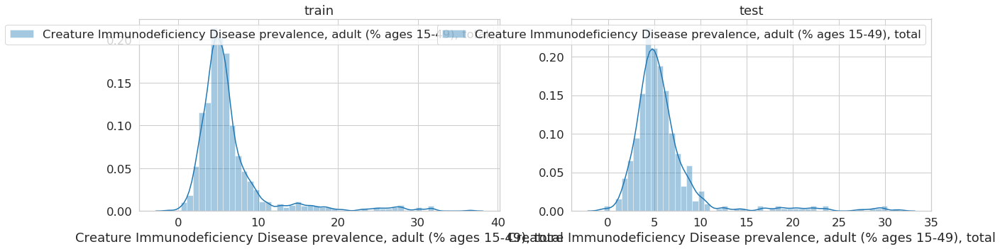

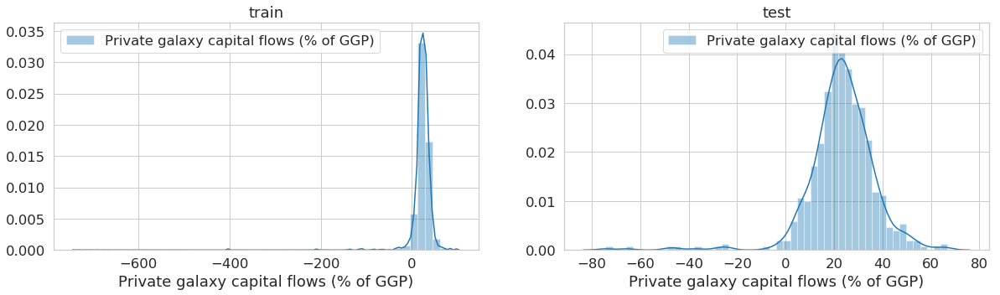

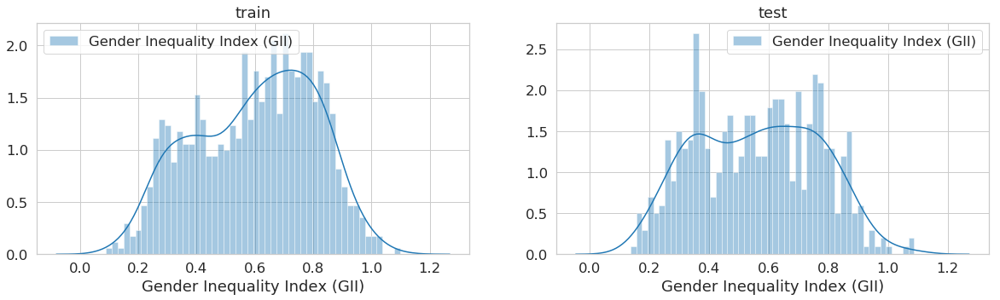

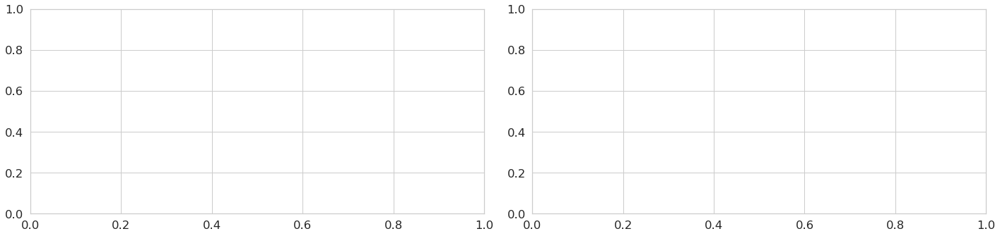

In [110]:
for j in range(len(df_num.columns.to_list())):
    fig, axis = plt.subplots(1, 2, figsize=(20, 5))
    ax = axis.ravel()
    for i in range(len(datasets)):
        feature_dist(data_all, df_num.columns.to_list()[j], ax[i], datasets[i])
fig.tight_layout()

In [159]:
def plot_boxplot(data, column_name, axn, datasetname):
    if column_name != 'y':
        df = data[(data['type']==datasetname)]
        df = df.loc[:,[column_name]]
        sns.boxplot(x = 'variable', y = 'value', data = df.melt(), ax=axn).set_title(datasetname)

In [160]:
len(df_num.columns.to_list())

79

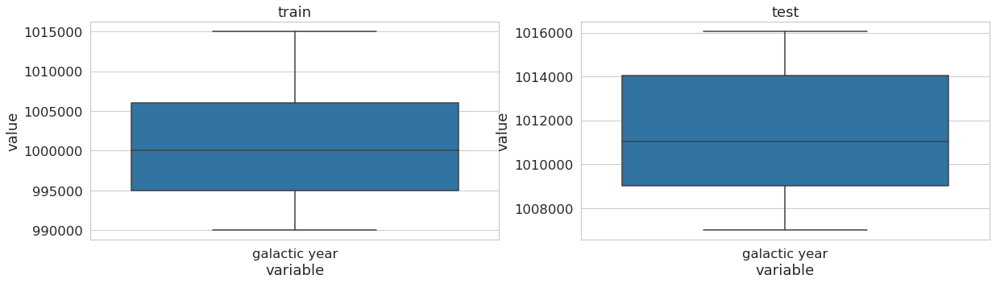

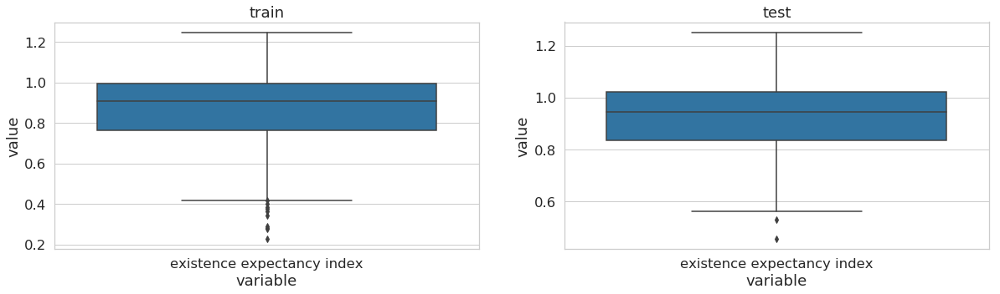

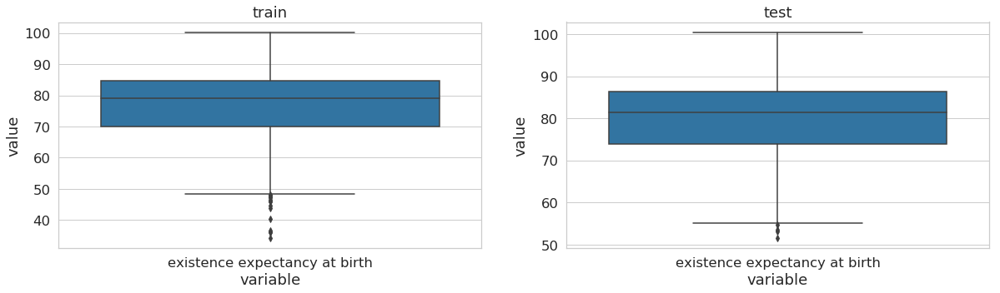

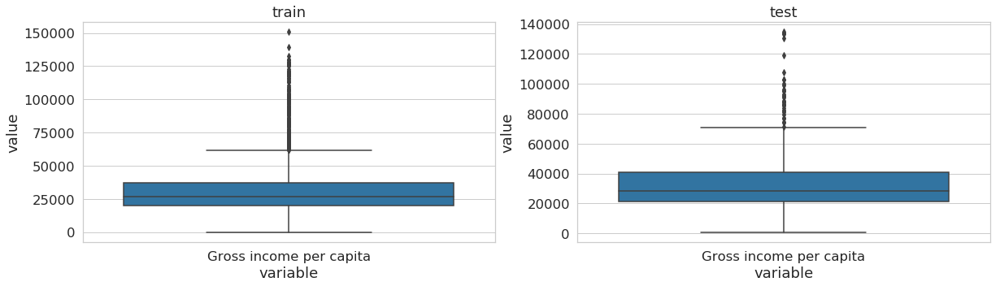

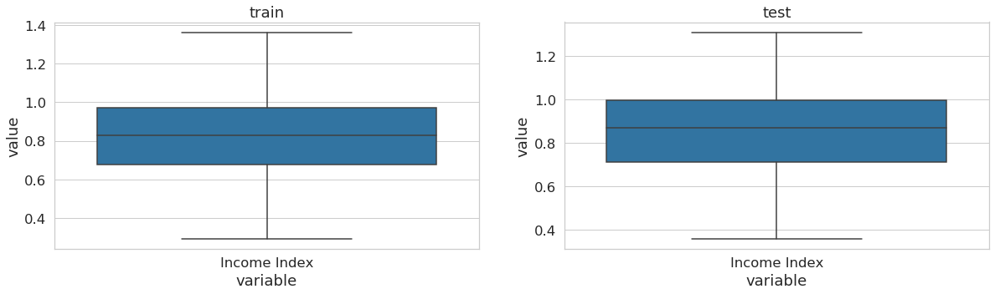

...

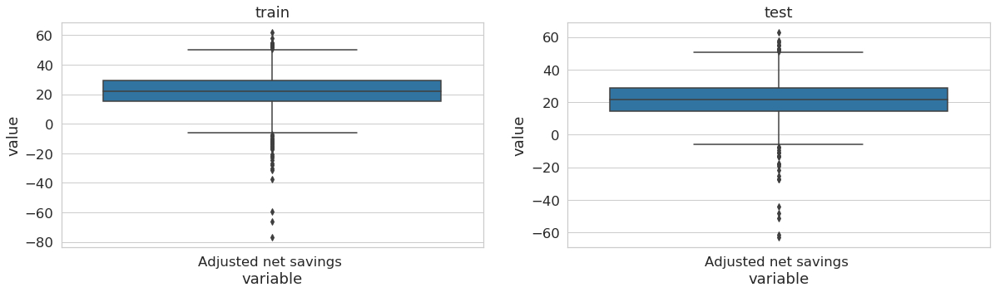

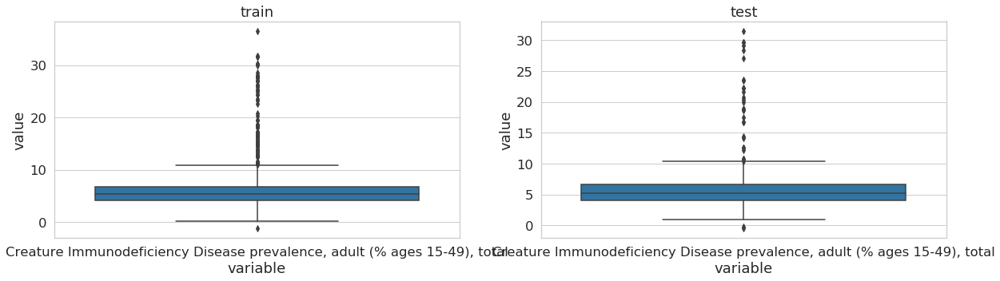

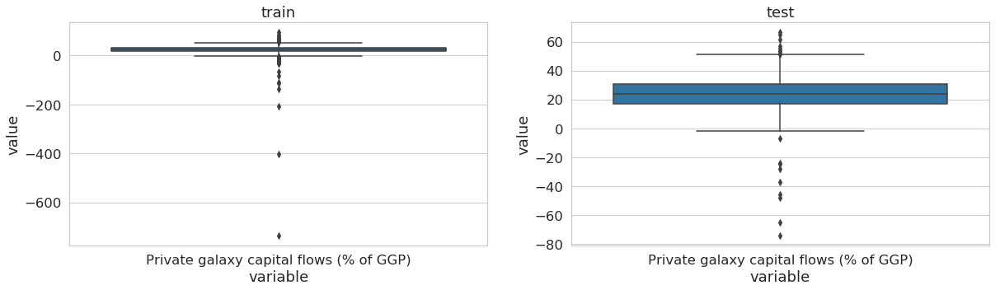

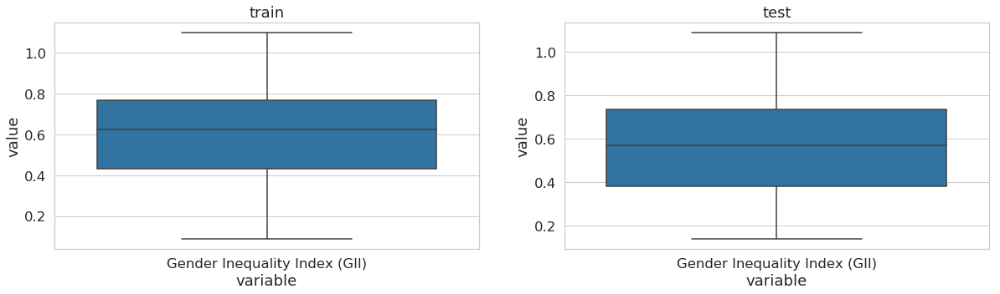

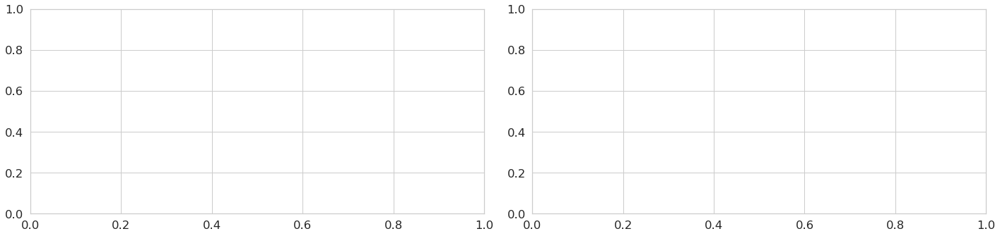

In [162]:
for i in range(len(df_num.columns.to_list())):
    fig, axis = plt.subplots(1, 2, figsize=(20, 5))
    ax = axis.ravel()
    for j in range(len(datasets)):
        plot_boxplot(data_all, df_num.columns.to_list()[i], ax[j], datasets[j])
fig.tight_layout()